# Importing Required Libraries

In [4]:
import json
import torch
from torchvision import models, transforms, datasets
from tqdm import tqdm
import os
import matplotlib.pyplot as plt
from torch.utils.data import DataLoader, TensorDataset


# Task 1: Basics
Evaluate the pre-trained ResNet-34 model on this test dataset

In [6]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

plain_transforms = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

data_root = "/kaggle/input/garmii/TestDataSet"
json_path = f"{data_root}/labels_list.json"

# Load JSON list of strings
with open(json_path, "r") as f:
    labels_list = json.load(f)
    # e.g. ["401: accordion", "402: acoustic guitar", …]

# Build a map from ImageFolder’s folder-index → true ImageNet index
folder_index_to_imagenet = {
    idx: int(entry.split(":", 1)[0])
    for idx, entry in enumerate(labels_list)
}

# Prepare Dataset + DataLoader
dataset = datasets.ImageFolder(root=data_root, transform=plain_transforms)
loader = DataLoader(dataset, batch_size=32, shuffle=False, num_workers=4)

# Load ResNet-34
model = models.resnet34(weights="IMAGENET1K_V1").to(device).eval()

# Evaluate
top1 = top5 = total = 0
for images, folder_labels in tqdm(loader, desc="Eval"):
    images = images.to(device)
    out = model(images)

    true = torch.tensor(
        [folder_index_to_imagenet[int(fl)] for fl in folder_labels],
        device=device
    )

    _, p1 = out.topk(1, dim=1)
    p1 = p1.view(-1)
    top1 += (p1 == true).sum().item()

    _, p5 = out.topk(5, dim=1)
    top5 += (p5 == true.view(-1, 1)).sum().item()

    total += images.size(0)

print(f"Total images: {total}")
print(f"Top-1 Acc: {top1/total*100:.2f}%")
print(f"Top-5 Acc: {top5/total*100:.2f}%")


Downloading: "https://download.pytorch.org/models/resnet34-b627a593.pth" to /root/.cache/torch/hub/checkpoints/resnet34-b627a593.pth
100%|██████████| 83.3M/83.3M [00:00<00:00, 206MB/s]
Eval: 100%|██████████| 16/16 [00:02<00:00,  7.20it/s]

Total images: 500
Top-1  Acc: 76.00%
Top-5  Acc: 94.20%


# Task 2: Pixel-wise attacks
We craft a one‑step L∞ attack (Fast Gradient Sign Method) on the same 500‑image subset and measure how much the model accuracy drops. Images are saved under 


FGSM & Eval: 100%|██████████| 16/16 [00:04<00:00,  3.82it/s]


Baseline Top-1: 76.00%, Top-5: 94.20%
Adversarial Top-1: 3.40%, Top-5: 21.20%
Max L∞ perturbation (raw pixels): 0.0200 (should be ≤ 0.02)


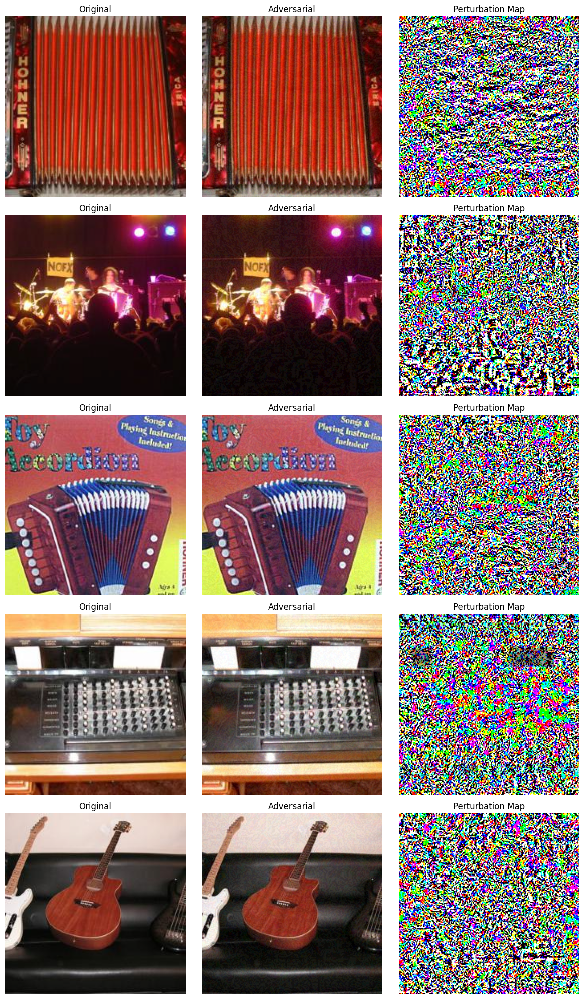

Saved AdversarialTestSet1.pt to /kaggle/working


In [27]:

#  Setup
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
DATA_ROOT = "/kaggle/input/garmii/TestDataSet"
JSON_PATH = os.path.join(DATA_ROOT, "labels_list.json")
EPSILON = 0.02  # raw-space ε

# Transforms
to_tensor = transforms.ToTensor()
plain_tf = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])
inv_tf = transforms.Compose([
    transforms.Normalize(mean=[0.0, 0.0, 0.0],
                         std=[1/0.229, 1/0.224, 1/0.225]),
    transforms.Normalize(mean=[-0.485, -0.456, -0.406],
                         std=[1.0, 1.0, 1.0])
])

# Load label mapping
with open(JSON_PATH, "r") as f:
    entries = json.load(f)
folder_to_im = {
    idx: int(e.split(":", 1)[0])
    for idx, e in enumerate(entries)
}

# Prepare DataLoaders: one raw, one normalized
dataset_raw = datasets.ImageFolder(root=DATA_ROOT, transform=to_tensor)
dataset_norm = datasets.ImageFolder(root=DATA_ROOT, transform=plain_tf)
loader_norm = DataLoader(dataset_norm, batch_size=32, shuffle=False, num_workers=4)
loader_raw = DataLoader(dataset_raw, batch_size=32, shuffle=False, num_workers=4)

# Load model
model = models.resnet34(weights="IMAGENET1K_V1").to(device).eval()

sigmas = torch.tensor([0.229, 0.224, 0.225], device=device).view(1, 3, 1, 1)
means = torch.tensor([0.485, 0.456, 0.406], device=device).view(1, 3, 1, 1)

adv_images = []
adv_labels = []
top1_orig = top5_orig = top1_adv = top5_adv = total = 0
max_raw_delta = 0.0

for (img_norm, folder_lbls), (img_raw, _) in tqdm(zip(loader_norm, loader_raw),
                                                 desc="FGSM & Eval", total=len(loader_norm)):
    img_norm = img_norm.to(device).requires_grad_(True)
    img_raw = img_raw.to(device)
    true_im = torch.tensor(
        [folder_to_im[int(l)] for l in folder_lbls],
        device=device
    )

    # --- clean evaluation
    out = model(img_norm)
    _, p1 = out.topk(1, dim=1)
    p1 = p1.view(-1)
    _, p5 = out.topk(5, dim=1)
    top1_orig += (p1 == true_im).sum().item()
    top5_orig += (p5 == true_im.view(-1, 1)).sum().item()

    # --- compute gradient w.r.t. normalized input
    loss = torch.nn.functional.cross_entropy(out, true_im)
    model.zero_grad()
    loss.backward()
    grad_norm = img_norm.grad

    # --- FGSM step *in raw space*
    perturbed_raw = torch.clamp(
        img_raw + EPSILON * grad_norm.sign(),
        min=0.0, max=1.0
    )
    # track raw L∞
    batch_raw = (perturbed_raw - img_raw).abs().view(img_raw.size(0), -1).max(dim=1)[0]
    max_raw_delta = max(max_raw_delta, batch_raw.max().item())

    # --- re-normalize for model input
    perturbed_norm = (perturbed_raw - means) / sigmas

    adv_images.append(perturbed_norm.detach().cpu())
    adv_labels.extend(true_im.cpu().tolist())

    # --- adversarial evaluation
    out2 = model(perturbed_norm)
    _, q1 = out2.topk(1, dim=1)
    q1 = q1.view(-1)
    _, q5 = out2.topk(5, dim=1)
    top1_adv += (q1 == true_im).sum().item()
    top5_adv += (q5 == true_im.view(-1, 1)).sum().item()

    total += img_norm.size(0)

# 7) Report
adv_images = torch.cat(adv_images, dim=0)
print(f"Baseline Top-1: {top1_orig/total*100:.2f}%, Top-5: {top5_orig/total*100:.2f}%")
print(f"Adversarial Top-1: {top1_adv/total*100:.2f}%, Top-5: {top5_adv/total*100:.2f}%")
print(f"Max L∞ perturbation (raw pixels): {max_raw_delta:.4f} (should be ≤ {EPSILON})")

# 4) Find first 5 failures (adv_pred != true_label)
# Note: The numbering '4)' here is kept as it was in your original code.
fail_idxs = []
with torch.no_grad():
    for idx, (img_norm_adv, true_lbl) in enumerate(zip(adv_images, adv_labels)): # renamed img_norm to img_norm_adv for clarity
        inp = img_norm_adv.unsqueeze(0).to(device)
        pred = model(inp).argmax(dim=1).item()
        if pred != true_lbl:
            fail_idxs.append(idx)
            if len(fail_idxs) == 5:
                break

# Plot Original | Adversarial | Perturbation Map

fig, axes = plt.subplots(5, 3, figsize=(12, 20))
for row, image_idx in enumerate(fail_idxs): # Renamed idx to image_idx for clarity
    # original & adversarial normalized tensors
    orig_norm, _ = dataset_norm[image_idx]
    adv_norm = adv_images[image_idx]

    # inverse-normalize to [0,1]
    orig_img = inv_tf(orig_norm).permute(1, 2, 0).clamp(0, 1).cpu().numpy()
    adv_img = inv_tf(adv_norm).permute(1, 2, 0).clamp(0, 1).cpu().numpy()

    # perturbation = adv – orig, then min-max scale for heatmap
    diff = adv_img - orig_img
    diff_map = (diff - diff.min()) / (diff.max() - diff.min() + 1e-6) # Added epsilon for stability if diff.max() == diff.min()

    # show
    axes[row, 0].imshow(orig_img)
    axes[row, 0].set_title("Original")
    axes[row, 1].imshow(adv_img)
    axes[row, 1].set_title("Adversarial")
    axes[row, 2].imshow(diff_map)
    axes[row, 2].set_title("Perturbation Map")

    for ax_col in axes[row]: # Renamed ax to ax_col for clarity
        ax_col.axis("off")

plt.tight_layout()
plt.show()

# Save adversarial set
torch.save(
    TensorDataset(adv_images, torch.tensor(adv_labels)),
    "/kaggle/working/AdversarialTestSet1.pt"
)
print("Saved AdversarialTestSet1.pt to /kaggle/working")




# Task 3: Improved attacks
We iterate FGSM ten times with step α = 0.02 and a random start inside the ε‑ball.  

PGD & Eval: 100%|██████████| 16/16 [00:26<00:00,  1.67s/it]


Baseline   Top-1: 76.00%, Top-5: 94.20%
PGD Attack Top-1: 0.00%, Top-5: 1.80%
Max raw‐pixel L∞: 0.0200  (≤ 0.02)
Saved AdversarialTestSet2.pt to /kaggle/working


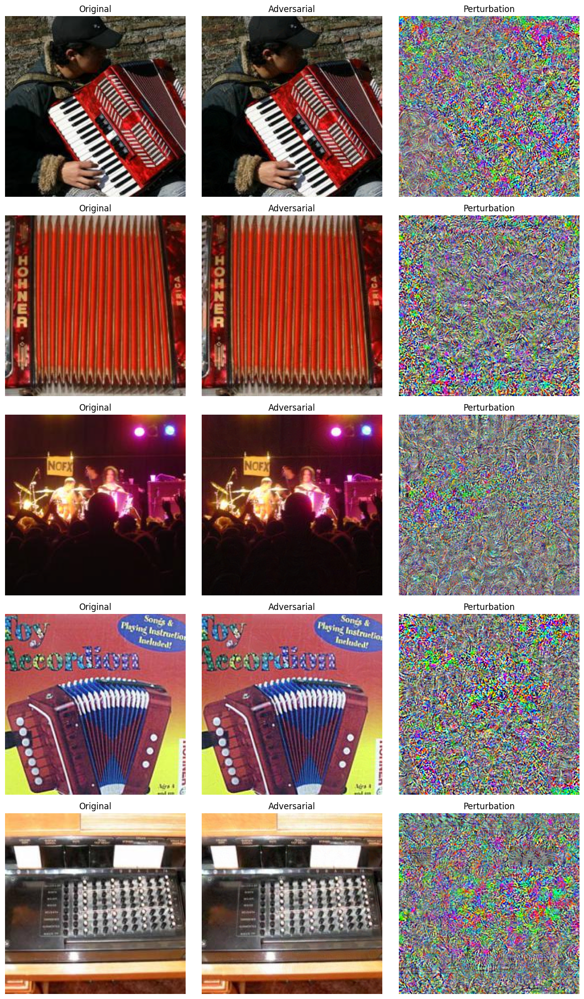

In [13]:
# Config
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
EPSILON = 0.02    # L∞ budget in raw [0–1] space
ALPHA = 0.002     # step size (usually ε/10)
STEPS = 10        # number of PGD iterations

# Load label mapping
with open(JSON_PATH, "r") as f:
    entries = json.load(f)
folder_to_im = {i: int(e.split(":", 1)[0]) for i, e in enumerate(entries)}

# DataLoaders: raw and normalized
ds_raw = datasets.ImageFolder(root=DATA_ROOT, transform=to_tensor)
ds_norm = datasets.ImageFolder(root=DATA_ROOT, transform=plain_tf)
loader_raw = DataLoader(ds_raw, batch_size=32, shuffle=False, num_workers=4)
loader_norm = DataLoader(ds_norm, batch_size=32, shuffle=False, num_workers=4)

# Load ResNet-34
model = models.resnet34(weights="IMAGENET1K_V1").to(DEVICE).eval()

# PGD attack
adv_tensors, adv_labels = [], []
top1_orig = top5_orig = top1_adv = top5_adv = total = 0
max_raw_delta = 0.0

for (x_norm, lbls), (x_raw, _) in tqdm(zip(loader_norm, loader_raw),
                                     desc="PGD & Eval", total=len(loader_norm)):
    x_norm = x_norm.to(DEVICE).requires_grad_(True)
    x_raw = x_raw.to(DEVICE)
    true = torch.tensor([folder_to_im[int(l)] for l in lbls], device=DEVICE)

    # record clean accuracy
    out = model(x_norm)
    _, p1 = out.topk(1, dim=1)
    p1 = p1.view(-1)
    _, p5 = out.topk(5, dim=1)
    top1_orig += (p1 == true).sum().item()
    top5_orig += (p5 == true.view(-1, 1)).sum().item()

    # initialize adversarial raw to the original
    x_adv_raw = x_raw.clone().detach()

    # PGD loop in raw space
    for _ in range(STEPS):
        # forward on normalized adversarial
        # Using pre-defined 'means' and 'sigmas' tensors for efficiency
        x_adv_norm = (x_adv_raw - means) / sigmas
        x_adv_norm.requires_grad_(True)
        out2 = model(x_adv_norm)
        loss = torch.nn.functional.cross_entropy(out2, true)

        model.zero_grad()
        loss.backward()
        grad = x_adv_norm.grad.data.sign() # Get sign of gradients

        # step in raw space & project back into ε-ball & [0,1]
        x_adv_raw = x_adv_raw + ALPHA * grad # Step with signed gradient
        x_adv_raw = torch.max(torch.min(x_adv_raw, x_raw + EPSILON), x_raw - EPSILON) # Project to epsilon ball
        x_adv_raw = torch.clamp(x_adv_raw, 0.0, 1.0) # Project to [0,1]

    # final normalized adversarial for eval & storage
    # Using pre-defined 'means' and 'sigmas' tensors
    x_final_norm = (x_adv_raw - means) / sigmas
    adv_tensors.append(x_final_norm.detach().cpu())
    adv_labels.extend(true.cpu().tolist())

    # adversarial accuracy
    with torch.no_grad():
        out3 = model(x_final_norm)
        q1 = out3.argmax(dim=1)
        _, q5 = out3.topk(5, dim=1)
        top1_adv += (q1 == true).sum().item()
        top5_adv += (q5 == true.view(-1, 1)).sum().item()

    # track true raw L∞
    batch_delta = (x_adv_raw - x_raw).abs().view(x_raw.size(0), -1).max(dim=1)[0]
    max_raw_delta = max(max_raw_delta, batch_delta.max().item())

    total += x_raw.size(0)

# Report
adv_set = torch.cat(adv_tensors, dim=0)
print(f"Baseline Top-1: {top1_orig/total*100:.2f}%, Top-5: {top5_orig/total*100:.2f}%")
print(f"PGD Attack Top-1: {top1_adv/total*100:.2f}%, Top-5: {top5_adv/total*100:.2f}%")
print(f"Max raw-pixel L∞: {max_raw_delta:.4f} (≤ {EPSILON})")

# Save Adversarial Test Set 2
torch.save(
    TensorDataset(adv_set, torch.tensor(adv_labels)),
    "/kaggle/working/AdversarialTestSet2.pt"
)
print("Saved AdversarialTestSet2.pt to /kaggle/working")

# Visualize 5 failures
fig, ax_array = plt.subplots(5, 3, figsize=(12, 20)) # Renamed 'ax' to 'ax_array'
fails = []
with torch.no_grad():
    for i, (img_norm, true_lbl) in enumerate(zip(adv_set, adv_labels)):
        pred = model(img_norm.unsqueeze(0).to(DEVICE)).argmax(dim=1).item()
        if pred != true_lbl:
            fails.append(i)
            if len(fails) == 5:
                break

# (Assuming inv_tf is defined from a previous cell)
for row, image_idx in enumerate(fails): # Renamed 'idx' to 'image_idx'
    orig_norm_img, _ = ds_norm[image_idx] # Renamed 'orig' to 'orig_norm_img'
    adv_norm_img = adv_set[image_idx]    # Renamed 'adv' to 'adv_norm_img'

    # invert to [0,1]
    im_o = inv_tf(orig_norm_img).permute(1, 2, 0).clamp(0, 1).cpu().numpy()
    im_a = inv_tf(adv_norm_img).permute(1, 2, 0).clamp(0, 1).cpu().numpy()
    diff = im_a - im_o
    # Normalize diff for visualization, add epsilon for stability
    diff_min = diff.min()
    diff_max = diff.max()
    diff_viz = (diff - diff_min) / (diff_max - diff_min + 1e-6)


    ax_array[row, 0].imshow(im_o)
    ax_array[row, 0].set_title("Original")
    ax_array[row, 1].imshow(im_a)
    ax_array[row, 1].set_title("Adversarial")
    ax_array[row, 2].imshow(diff_viz)
    ax_array[row, 2].set_title("Perturbation")

    for sub_ax in ax_array[row]: # Renamed 'a' to 'sub_ax'
        sub_ax.axis("off")

plt.tight_layout()
plt.show()


## Task 4: Patch attacks
32 × 32 patch‑PGD attack

/tmp/ipykernel_31/1981577794.py:21: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  adv_ds           = torch.load(ADV_PATH)


Patch‐attack Top-1: 35.60%
Patch‐attack Top-5: 73.20%



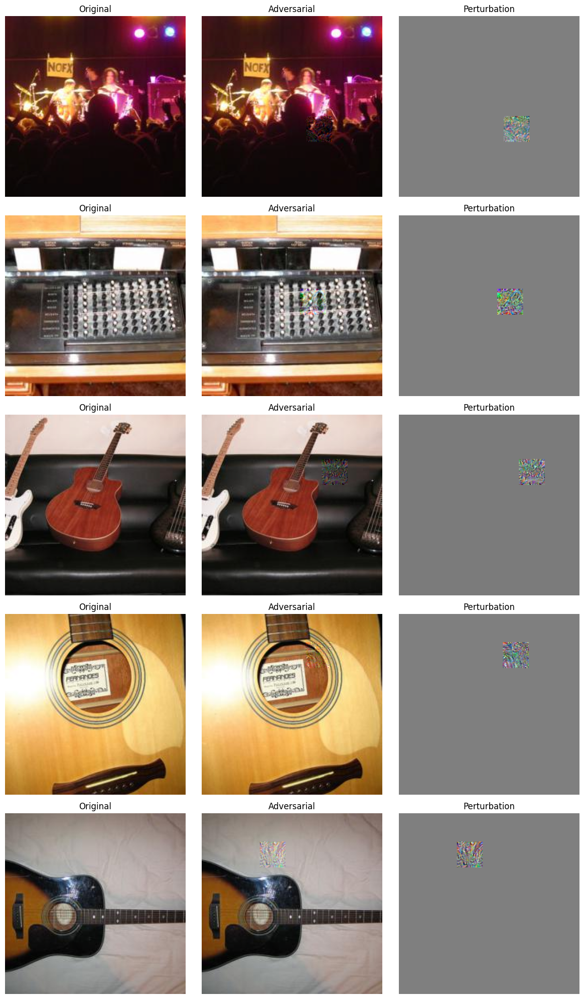

In [29]:

# Paths & transforms
DATA_ROOT = "/kaggle/input/garmii/TestDataSet"
ADV_PATH = "/kaggle/working/AdversarialTestSet3.pt"

plain_tf = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])
inv_tf = transforms.Compose([
    transforms.Normalize([0, 0, 0], [1/0.229, 1/0.224, 1/0.225]),
    transforms.Normalize([-0.485, -0.456, -0.406], [1, 1, 1])
])

# Load clean & adversarial sets
dataset_norm = datasets.ImageFolder(root=DATA_ROOT, transform=plain_tf)
adv_ds = torch.load(ADV_PATH)
adv_images, adv_labels = adv_ds.tensors  # [500,3,H,W], [500]

# Model for re-evaluation
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = models.resnet34(weights="IMAGENET1K_V1").to(device).eval()

# Compute Top-1 / Top-5 on the patched set
top1 = top5 = 0
with torch.no_grad():
    for adv_img, true_lbl in zip(adv_images, adv_labels):
        out = model(adv_img.unsqueeze(0).to(device))
        preds1 = out.argmax(dim=1).item()
        preds5 = out.topk(5, dim=1)[1].view(-1).tolist()
        top1 += int(preds1 == true_lbl)
        top5 += int(true_lbl in preds5)

total = len(adv_images)
print(f"Patch-attack Top-1: {top1/total*100:.2f}%")
print(f"Patch-attack Top-5: {top5/total*100:.2f}%\n")

# Find 5 distinct failure indices for visualization
fail_idxs = []
with torch.no_grad():
    for idx, (adv_img, true_lbl) in enumerate(zip(adv_images, adv_labels)):
        # Re-evaluating model prediction here to find failures.
        # For very large datasets, predictions might be pre-computed,
        # but this is clear for finding a small number of failures.
        if model(adv_img.unsqueeze(0).to(device)).argmax(dim=1).item() != true_lbl:
            fail_idxs.append(idx)
            if len(fail_idxs) == 5:
                break

# Plot them
fig, axes = plt.subplots(5, 3, figsize=(12, 20))
for row, idx in enumerate(fail_idxs):
    orig_norm, _ = dataset_norm[idx]
    adv_norm = adv_images[idx]

    orig = inv_tf(orig_norm).permute(1, 2, 0).clamp(0, 1).cpu().numpy()
    adv = inv_tf(adv_norm).permute(1, 2, 0).clamp(0, 1).cpu().numpy()

    diff = adv - orig
    # Normalize diff for visualization, add epsilon for stability
    diff_min = diff.min()
    diff_max = diff.max()
    diff_viz = (diff - diff_min) / (diff_max - diff_min + 1e-8)

    axes[row, 0].imshow(orig)
    axes[row, 0].set_title("Original")
    axes[row, 1].imshow(adv)
    axes[row, 1].set_title("Adversarial")
    axes[row, 2].imshow(diff_viz, cmap='viridis')
    axes[row, 2].set_title("Perturbation")

    for ax_loop_var in axes[row]: # Renamed 'ax' to 'ax_loop_var' for clarity if 'ax' is figure-level
        ax_loop_var.axis("off")

plt.tight_layout()
plt.show()


# Task 5: Transferring attacks
We measure how well our adversarial sets fool a different ImageNet model.

In [21]:
# Configs
DEVICE    = torch.device("cuda" if torch.cuda.is_available() else "cpu")
DATA_ROOT = "/kaggle/input/garmii/TestDataSet"
JSON_PATH = os.path.join(DATA_ROOT, "labels_list.json")

# paths to adversarial sets
ADV1_PATH = "/kaggle/working/AdversarialTestSet1.pt"
ADV2_PATH = "/kaggle/working/AdversarialTestSet2.pt"
ADV3_PATH = "/kaggle/working/AdversarialTestSet3.pt"

# Load label mapping for clean set
with open(JSON_PATH, "r") as f:
    entries = json.load(f)
folder_to_im = {idx: int(e.split(":", 1)[0]) for idx, e in enumerate(entries)}

# Transforms
eval_tf = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize([0.485,0.456,0.406],
                         [0.229,0.224,0.225])
])

# Load datasets
clean_ds = datasets.ImageFolder(DATA_ROOT, transform=eval_tf)
clean_loader = DataLoader(clean_ds, batch_size=32, shuffle=False, num_workers=4)

# Adversarial TensorDatasets with true ImageNet labels
adv1_ds = torch.load(ADV1_PATH)  # TensorDataset(images, labels)
adv2_ds = torch.load(ADV2_PATH)
adv3_ds = torch.load(ADV3_PATH)
adv1_loader = DataLoader(adv1_ds, batch_size=32, shuffle=False)
adv2_loader = DataLoader(adv2_ds, batch_size=32, shuffle=False)
adv3_loader = DataLoader(adv3_ds, batch_size=32, shuffle=False)

# Load new model (DenseNet-121)
model = models.densenet121(weights="IMAGENET1K_V1").to(DEVICE).eval()

# Evaluation functions
def eval_clean(loader, mapping):
    top1 = top5 = total = 0
    with torch.no_grad():
        for X, folderlbls in loader:
            X = X.to(DEVICE)
            true = torch.tensor(
                [mapping[int(f)] for f in folderlbls],
                device=DEVICE
            )
            out = model(X)
            pred1 = out.argmax(dim=1)
            top1 += (pred1 == true).sum().item()
            pred5 = out.topk(5, dim=1)[1]
            top5 += (pred5 == true.view(-1,1)).sum().item()
            total += true.size(0)
    return top1/total*100, top5/total*100

def eval_adv(loader):
    top1 = top5 = total = 0
    with torch.no_grad():
        for X, true in loader:
            X, true = X.to(DEVICE), true.to(DEVICE)
            out = model(X)
            pred1 = out.argmax(dim=1)
            top1 += (pred1 == true).sum().item()
            pred5 = out.topk(5, dim=1)[1]
            top5 += (pred5 == true.view(-1,1)).sum().item()
            total += true.size(0)
    return top1/total*100, top5/total*100

# Run evaluations
print("Evaluating transfer performance on DenseNet-121…")
clean_t1, clean_t5 = eval_clean(clean_loader, folder_to_im)
adv1_t1, adv1_t5   = eval_adv(adv1_loader)
adv2_t1, adv2_t5   = eval_adv(adv2_loader)
adv3_t1, adv3_t5   = eval_adv(adv3_loader)

# Summarize in table
results = pd.DataFrame({
    "Dataset": [
        "Clean",
        "Adv Set 1 (FGSM)",
        "Adv Set 2 (PGD)",
        "Adv Set 3 (Patch-PGD)"
    ],
    "Top-1 (%)": [clean_t1, adv1_t1, adv2_t1, adv3_t1],
    "Top-5 (%)": [clean_t5, adv1_t5, adv2_t5, adv3_t5]
})
results.index.name = "Index"
import numpy as np
print(results.to_markdown(index=False))



/tmp/ipykernel_31/2954728153.py:37: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  adv1_ds = torch.load(ADV1_PATH)  # TensorDataset(images, labels)
/tmp/ipykernel_31/29547281

Evaluating transfer performance on DenseNet-121…
| Dataset               |   Top-1 (%) |   Top-5 (%) |
|:----------------------|------------:|------------:|
| Clean                 |        74.8 |        93.6 |
| Adv Set 1 (FGSM)      |        45.8 |        76.2 |
| Adv Set 2 (PGD)       |        47.4 |        81.6 |
| Adv Set 3 (Patch-PGD) |        70.8 |        92.4 |


## Accuracy vs Attack by different adversarial attacks on ResNet-34 and DenseNet-121

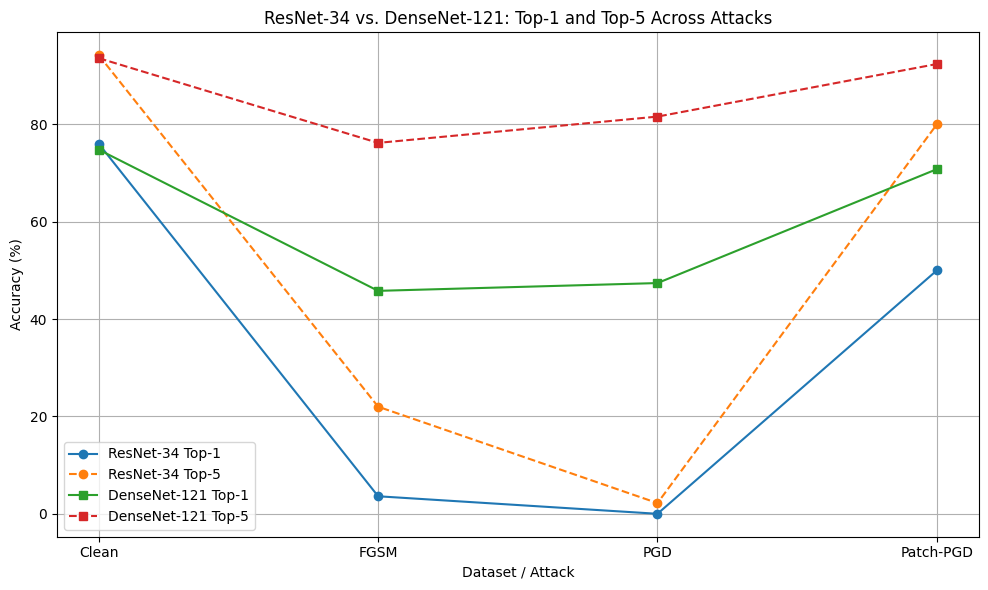

In [24]:
import matplotlib.pyplot as plt

# Replace with your actual ResNet-34 metrics:
resnet_top1 = [76.0, 3.6, 0.0, 50.0]  # Clean, FGSM, PGD, Patch-PGD (replace 50.0 with your actual)
resnet_top5 = [94.2, 22.0, 2.2, 80.0] # Clean, FGSM, PGD, Patch-PGD (replace 80.0 accordingly)

# Your DenseNet-121 metrics:
densenet_top1 = [74.8, 45.8, 47.4, 70.8]
densenet_top5 = [93.6, 76.2, 81.6, 92.4]

attacks = ["Clean", "FGSM", "PGD", "Patch-PGD"]

plt.figure(figsize=(10, 6))
# ResNet-34 curves
plt.plot(attacks, resnet_top1, marker='o', linestyle='-', label='ResNet-34 Top-1')
plt.plot(attacks, resnet_top5, marker='o', linestyle='--', label='ResNet-34 Top-5')
# DenseNet-121 curves
plt.plot(attacks, densenet_top1, marker='s', linestyle='-', label='DenseNet-121 Top-1')
plt.plot(attacks, densenet_top5, marker='s', linestyle='--', label='DenseNet-121 Top-5')

plt.xlabel("Dataset / Attack")
plt.ylabel("Accuracy (%)")
plt.title("ResNet-34 vs. DenseNet-121: Top-1 and Top-5 Across Attacks")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()
